In [1]:
import pandas as pd
import numpy as np
import glob

In [2]:
dataset=pd.read_csv("Flickr8k.token.txt",delimiter="\t")
dataset.columns = ['id','caption']

In [3]:
dataset.iloc[40457]['id'] = dataset.iloc[40456]['id']
dataset.iloc[40458]['id'] = dataset.iloc[40456]['id']

In [4]:
def filter_name(x):
#     print(x)
    try:
        return (x[:-2])
    except:
        print(x)
        
dataset['new_id'] = dataset['id'].apply(filter_name)
# a = dataset['id'][0][:-2]

In [5]:
data = dataset.drop('id',axis=1)

In [ ]:
!pip install googletrans

In [62]:
from googletrans import Translator
translator = Translator()

In [ ]:
def nepali_caption(x):
    translator = Translator()
    a = translator.translate(x, dest='ne')
    print(a)
    return a.text
data['nepali_caption'] = data['caption'].apply(nepali_caption)

In [46]:
data_with_nepali_caption = pd.read_csv('nepali_data.csv')

In [47]:
data_with_nepali_caption = data_with_nepali_caption.drop('Unnamed: 0',axis=1)

In [17]:
a = data_with_nepali_caption[data_with_nepali_caption['new_id'] == '1000268201_693b08cb0e.jpg']['nepali_caption'].tolist()

In [48]:
with_nepali = data_with_nepali_caption[:10000]

In [49]:
with_nepali.head(5)

,caption,new_id,nepali_caption
0,A girl going into a wooden building .,1000268201_693b08cb0e.jpg,एउटा केटी काठको भवनमा जाँदैछ।
1,A little girl climbing into a wooden playhouse .,1000268201_693b08cb0e.jpg,एक सानो केटी एक काठ को खेलघर मा चढाई।
2,A little girl climbing the stairs to her playh...,1000268201_693b08cb0e.jpg,एक सानो केटी आफ्नो घरघर मा सीढ़ियों मा चढाई।
3,A little girl in a pink dress going into a woo...,1000268201_693b08cb0e.jpg,एक गुलाबी पोशाकमा सानो केटी काठको केबिनमा जान्छ।
4,A black dog and a spotted dog are fighting,1001773457_577c3a7d70.jpg,एक कालो कुकुर र एक जना कुते कुत्ता लडिरहेको छ


In [ ]:
def change(x):
    try:
        return x[:-1]
    except:
        print('0')
with_nepali['caption'] = with_nepali['caption'].apply(change)

In [ ]:
def change(x):
    try:
        return x[:-1]
    except:
        print('0')
with_nepali['nepali_caption'] = with_nepali['nepali_caption'].apply(change)

In [53]:
photos = with_nepali['new_id'].unique()

In [54]:
new_combine_df = []
for pics in photos:
    nepali_combine = with_nepali[with_nepali['new_id']==pics]['nepali_caption'].tolist()
    english_combine = with_nepali[with_nepali['new_id']==pics]['caption'].tolist()
    result = [pics,english_combine,nepali_combine]
    new_combine_df.append(result)

In [55]:
new_combine_df = pd.DataFrame(new_combine_df,columns=['photo_id','english_caption','nepali_caption'])

In [56]:
new_combine_df['english_caption'][0]

['A girl going into a wooden building ',
 'A little girl climbing into a wooden playhouse ',
 'A little girl climbing the stairs to her playhouse ',
 'A little girl in a pink dress going into a wooden cabin ']

In [57]:
new_combine_df.to_csv('combined_frame.csv')

#### LETS try for english first 

In [1]:
import pandas as pd
import numpy as np
import glob

In [2]:
dataset=pd.read_csv("Flickr8k.token.txt",delimiter="\t")
dataset.columns = ['id','caption']

In [3]:
def filter_name(x):
#     print(x)
    try:
        return (x[:-2])
    except:
        print(x)
        
dataset['new_id'] = dataset['id'].apply(filter_name)

In [4]:
data = dataset.drop('id',axis=1)

In [5]:
data.head(5)

,caption,new_id
0,A girl going into a wooden building .,1000268201_693b08cb0e.jpg
1,A little girl climbing into a wooden playhouse .,1000268201_693b08cb0e.jpg
2,A little girl climbing the stairs to her playh...,1000268201_693b08cb0e.jpg
3,A little girl in a pink dress going into a woo...,1000268201_693b08cb0e.jpg
4,A black dog and a spotted dog are fighting,1001773457_577c3a7d70.jpg


In [6]:
def change(x):
    try:
        return x[:-1]
    except:
        print('0')
data['caption'] = data['caption'].apply(change)

In [7]:
photos = data['new_id'].unique()
new_combine_df = []
for pics in photos:
#     nepali_combine = with_nepali[with_nepali['new_id']==pics]['nepali_caption'].tolist()
    english_combine = data[data['new_id']==pics]['caption'].tolist()
    result = [pics,english_combine]
    new_combine_df.append(result)
new_combine_df = pd.DataFrame(new_combine_df,columns=['photo_id','caption'])

In [8]:
# data['caption_up'] = data['caption'].apply(unique_words)
bag_of_words = set()
for index_item in new_combine_df['caption']:
    [bag_of_words.update(element.split()) for element in index_item]

### Let's filter more

In [9]:
lower_all = [element.lower() for element in bag_of_words]

In [10]:
string_all = [element for element in lower_all if element.isalpha()]

In [11]:
bag_of_words = set(string_all)

### lets go for trainImage text

In [12]:
test_file = pd.read_csv("./dataset/Flickr_8k.testImages.txt",delimiter="\t")
test_file.columns = ['id']

In [13]:
train_file = pd.read_csv("./dataset/Flickr_8k.trainImages.txt",delimiter="\t")
train_file.columns = ['id']

In [14]:
image =glob.glob('./Flicker8k_Dataset/' + '*.jpg')

In [15]:
image = pd.DataFrame(image,columns=['path'])

In [16]:
def filter_path(x):
    return x[20:]
image['path'] = image['path'].apply(filter_path)

In [17]:
train_in_image = []
for name in train_file['id']:
    if name in image['path'].tolist():
        train_in_image.append(name)

In [18]:
test_in_image = []
for name in test_file['id']:
    if name in image['path'].tolist():
        test_in_image.append(name)

### For transfer learning process we should resize our image as to fit in model we are using

In [19]:
from PIL import Image
from keras.applications.inception_v3 import InceptionV3
from keras.models import Model

Using TensorFlow backend.


In [20]:
from keras.applications.inception_v3 import preprocess_input

In [39]:
from keras.preprocessing import image

In [21]:
model = InceptionV3()
model_new = Model(model.input, model.layers[-2].output) #removing last layer

96116736/96112376 [==============================] - 45s 0us/step


In [47]:
def preprocess_photo(path):
    imag = image.load_img(path, target_size=(299, 299)) #inception_v3 shape
    d_x = image.img_to_array(imag) #to 3d image i.e PIL to 3d
    x = np.expand_dims(d_x, axis=0) #according to paper, we should add one more dimension
    x = preprocess_input(x) #processing as inception_v3 model demands
    encoding_vec = model_new.predict(x) #encoding_veector of image
    encoding_vec = np.reshape(encoding_vec, encoding_vec.shape[1]) #remember!!! reshaping because efficient in computing and remove transpose and reshapes for future use. numpy internal functions.
    return encoding_vec

### Bro please update module 

now pass all train image to preprocess_phots and save in dictionary encoding_vec for images

pickle if you want

same for test image

pickle here too


pick all training caption



In [52]:
import os
cwd = os.getcwd()

In [53]:
print(len(train_in_image))
print(len(test_in_image))

5999
999


In [ ]:

train_encode_dict = {}
for each_image in train_in_image:
    path = os.path.join(cwd,'Flicker8k_Dataset',each_image)
    print(path)
    en_vector = preprocess_photo(path)
    train_encode_dict.update({each_image:en_vector})

In [49]:
import pickle
pickle_out = open('train_encode.pickle','wb')
pickle.dump(train_encode_dict,pickle_out)
pickle_out.close()

In [ ]:
test_encode_dict = {}
for each_image in test_in_image:
    path = os.path.join(cwd,'Flicker8k_Dataset',each_image)
    print(path)
    en_vector = preprocess_photo(path)
    test_encode_dict.update({each_image:en_vector})

In [51]:
pickle_out = open('test_encode.pickle','wb')
pickle.dump(test_encode_dict,pickle_out)
pickle_out.close()

In [64]:
# len(new_combine_df)
# len(train_in_image)
new_combine_df.head(3)
# train_in_image

,photo_id,caption
0,1000268201_693b08cb0e.jpg,"[A girl going into a wooden building , A littl..."
1,1001773457_577c3a7d70.jpg,"[A black dog and a spotted dog are fightin, A ..."
2,1002674143_1b742ab4b8.jpg,[A little girl covered in paint sits in front ...


In [108]:
training_caption = []
for element in train_in_image:
    if element in new_combine_df['photo_id'].tolist():
#         print(new_combine_df[new_combine_df['photo_id']==element]['caption'][0])
#         print(a)
        training_caption.append(new_combine_df[new_combine_df['photo_id']==element]['caption'].tolist()[0])

In [190]:
train_disc = {}
for i in range(5999):
    train_disc.update({train_in_image[i]:training_caption[i]})


In [191]:
# type(train_in_image[0])
# type(training_caption[0])
# for i,k in train_disc.items():
#     print(i)
#     print(k)
#     break

2903617548_d3e38d7f88.jpg
['A little baby plays croquet ', 'A little girl plays croquet next to a truck ', 'The child is playing croquette by the truck ', 'The kid is in front of a car with a put and a ball ', 'The little boy is playing with a croquet hammer and ball beside the car ']


In [118]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Sushil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [129]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
filtered_words = []
b = []
for lis in training_caption:
    a = []
    for list_item in lis:
        for words in list_item.split():
            if words.lower() not in stop_words:
                  a.append(words.lower())
                  b.append(words.lower())
                    
    filtered_words.append(a)    

In [131]:
# filtered_words[0]
len(b)

189275

In [132]:
unique_filtered_word = set(b)

In [133]:
len(unique_filtered_word)

8164

In [134]:
vocab_most_occuring = []
for word in unique_filtered_word:
    x = b.count(word)
    if x >=5:
        vocab_most_occuring.append(word)

In [161]:
len(vocab_most_occuring)

2543

In [139]:
index_to_word = {}
word_to_index = {}

index = 1
for w in vocab_most_occuring:
    word_to_index[w] = index
    index_to_word[index] = w
    index += 1

In [149]:
a = []
for caption in training_caption:
    for line in caption:
        a.append(len(line.split()))
longest_words_in_caption = max(a)

In [172]:
longest_words_in_caption

37

In [153]:
# train_encode_dict,test_encode_dict
discription = {**train_encode_dict,**test_encode_dict}

In [258]:
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key]
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq],vocab_size )[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
                    
            # yield the batch data
#             print(array(X1).shape)
#             print(array(X2).shape)
#             print(array(y).shape)
            if n==num_photos_per_batch:
#                 print([[array(X1), array(X2)], array(y)])
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

In [ ]:
vocab_size = len(index_to_word) +1

In [158]:
embeddings_index = {} # empty dictionary
f = open(os.path.join(cwd,'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [260]:
embedding_dim = 200
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in word_to_index.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i-1] = embedding_vector

In [169]:
embedding_matrix.shape

(2543, 200)

In [170]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
# from keras.applications.inception_v3 import InceptionV3
# from keras.preprocessing import image
# from keras.models import Model
from keras import Input, layers
from keras import optimizers
# from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

In [199]:
from numpy import array

In [278]:

inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(longest_words_in_caption,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [263]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, 37)           0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 37, 200)      508800      input_10[0][0]                   
__________________________________________________________________________________________________
dropout_8 (Dropout)             (None, 2048)         0           input_9[0][0]                    
__________________________________________________________________________________________________
dropout_9 

In [279]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [280]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [266]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_disc)

In [275]:
for i in range(4,epochs):
    generator = data_generator(train_disc,train_encode_dict, word_to_index, 37, number_pics_per_bath)
#     print(generator)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('.model_' + str(i) + '.h5')

Epoch 1/1
5999/5999 [==============================] - 2023s 337ms/step - loss: 3.5209
Epoch 1/1
5999/5999 [==============================] - 2313s 386ms/step - loss: 3.4638
Epoch 1/1
5999/5999 [==============================] - 2843s 474ms/step - loss: 3.4171
Epoch 1/1
5999/5999 [==============================] - 2306s 384ms/step - loss: 3.3865
Epoch 1/1
5999/5999 [==============================] - 2083s 347ms/step - loss: 3.3584
Epoch 1/1
5999/5999 [==============================] - 1927s 321ms/step - loss: 3.3360


In [268]:
model.save('./model' + str(i) + '.h5')

In [ ]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_disc)
for i in range(1,epochs):
    generator = data_generator(train_disc,train_encode_dict, word_to_index, 37, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
#     model.save('final' +str(i),'.h5')


In [ ]:
model.save_weights('model_30.h5')

In [270]:
pickle_out = open('train_disc.pickle','wb')
pickle.dump(train_disc,pickle_out)
pickle_out.close()

In [271]:
pickle_out = open('train_encode_dict.pickle','wb')
pickle.dump(train_encode_dict,pickle_out)
pickle_out.close()

In [272]:

pickle_out = open('word_to_index.pickle','wb')
pickle.dump(word_to_index,pickle_out)
pickle_out.close()

In [274]:
pickle_out = open('se1.pickle','wb')
pickle.dump(word_to_index,pickle_out)
pickle_out.close()
pickle_out = open('embedding_matrix.pickle','wb')
pickle.dump(word_to_index,pickle_out)
pickle_out.close()


Lets see how it predict for test image

In [5]:
json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model.h5")
print("Loaded model from disk")

Instructions for updating:
keep_dims is deprecated, use keepdims instead
Loaded model from disk


In [6]:
def preprocess_input(x):
    x /= 255.
    x -= 0.5
    x *= 2.
    return x
def preprocess(image_path):
    img = image.load_img(image_path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    x = preprocess_input(x)
    return x
def encode(image):
    image = preprocess(image)
    temp_enc = model_new.predict(image)
    temp_enc = np.reshape(temp_enc, temp_enc.shape[1])
    return temp_enc

In [18]:
def predict_captions(image_file):
    start_word = ["<start>"]
    while 1:
        now_caps = [word_idx[i] for i in start_word]
        now_caps = sequence.pad_sequences([now_caps], maxlen=max_length, padding='post')
        e = encode(image_file)
        preds = loaded_model.predict([np.array([e]), np.array(now_caps)])
        word_pred = idx_word[np.argmax(preds[0])]
        start_word.append(word_pred)
        
        if word_pred == "<end>" or len(start_word) > max_length: 
    #keep on predicting next word unitil word predicted is <end> or caption lenghts is greater than max_lenght(40)
            break
            
    return ' '.join(start_word[1:-1])

In [19]:
def beam_search_predictions(image_file, beam_index = 3):
    start = [word_idx["<start>"]]
    
    start_word = [[start, 0.0]]
    
    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            now_caps = sequence.pad_sequences([s[0]], maxlen=max_length, padding='post')
            e = encode(image_file)
            preds = loaded_model.predict([np.array([e]), np.array(now_caps)])
            
            word_preds = np.argsort(preds[0])[-beam_index:]
            
            # Getting the top Beam index = 3  predictions and creating a 
            # new list so as to put them via the model again
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-beam_index:]
    
    start_word = start_word[-1][0]
    intermediate_caption = [idx_word[i] for i in start_word]

    final_caption = []
    
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
        else:
            break
    
    final_caption = ' '.join(final_caption[1:])
    return final_caption

In [21]:
def show_result(image_file):
    im = Image.open(image_file)
    im.show()
    print ('Greedy search:', predict_captions(image_file))
    print ('Beam Search, k=3:', beam_search_predictions(image_file, beam_index=3))
    print ('Beam Search, k=5:', beam_search_predictions(image_file, beam_index=5))
    print ('Beam Search, k=7:', beam_search_predictions(image_file, beam_index=7))

In [9]:
word_idx_file = open('word_idx.p','rb')
word_idx = pickle.load(word_idx_file)
word_idx_file.close()

In [10]:
word_idx_file = open('max_length.p','rb')
max_length = pickle.load(word_idx_file)
word_idx_file.close()

In [11]:
word_idx_file = open('idx_word.p','rb')
idx_word = pickle.load(word_idx_file)
word_idx_file.close()

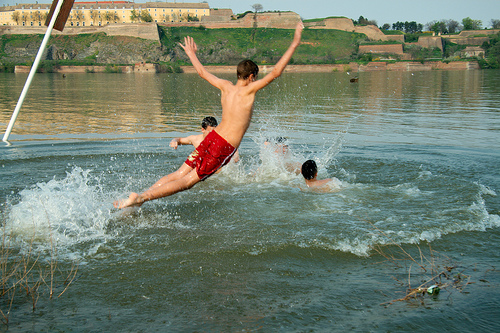

In [89]:
image_file ="3430607596_7e4f74e3ff.jpg"
test_image =  images + image_file
Image.open(test_image)

In [90]:
print ('Greedy search:', predict_captions(image_file))
print ('Beam Search, k=3:', beam_search_predictions(image_file, beam_index=3))
print ('Beam Search, k=5:', beam_search_predictions(image_file, beam_index=5))
print ('Beam Search, k=7:', beam_search_predictions(image_file, beam_index=7))

Greedy search: Three people in water in the pool .
Beam Search, k=3: Three people bathe in a pool .
Beam Search, k=5: Three people bathe in a pool .
Beam Search, k=7: Three people bathe in a pool .


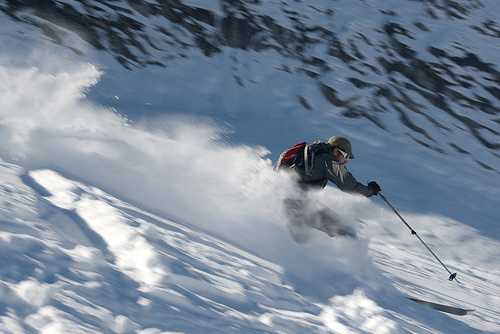

In [51]:
image_file ="3255482333_5bcee79f7e.jpg"
test_image =  images + image_file
Image.open(test_image)

In [52]:
print ('Greedy search:', predict_captions(image_file))
print ('Beam Search, k=3:', beam_search_predictions(image_file, beam_index=3))
print ('Beam Search, k=5:', beam_search_predictions(image_file, beam_index=5))
print ('Beam Search, k=7:', beam_search_predictions(image_file, beam_index=7))

Greedy search: A skier falls down a snowy snowy snowy mountain .
Beam Search, k=3: A skier falls down a snowy snowy mountain .
Beam Search, k=5: A skier falls down a snowy snowy mountain .
Beam Search, k=7: A skier falls down a snowy hill .


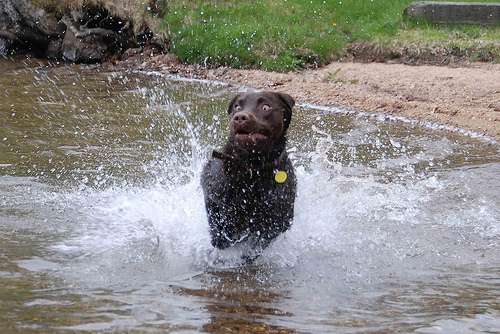

In [59]:
image_file ="2541104331_a2d65cfa54.jpg"
test_image =  images + image_file
Image.open(test_image)

In [60]:
print ('Greedy search:', predict_captions(image_file))
print ('Beam Search, k=3:', beam_search_predictions(image_file, beam_index=3))
print ('Beam Search, k=5:', beam_search_predictions(image_file, beam_index=5))
print ('Beam Search, k=7:', beam_search_predictions(image_file, beam_index=7))

Greedy search: A black dog is is in water the water .
Beam Search, k=3: A black dog swims in a water in the water .
Beam Search, k=5: A black dog is swims in the water .
Beam Search, k=7: A black dog is swims in the water .


## DEMO 

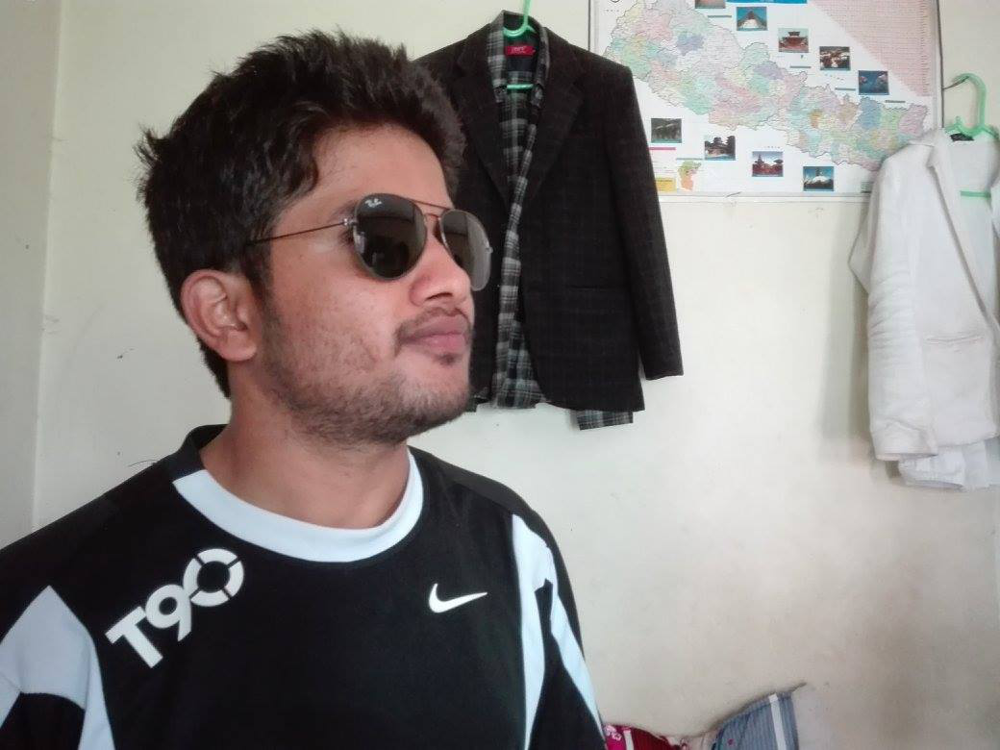

In [86]:
image_file ="tryimage.jpg"
Image.open(image_file)

In [87]:
print ('Greedy search:', predict_captions_test(image_file))

Greedy search: A man wearing glasses a green holding holding a arm with wearing the background .


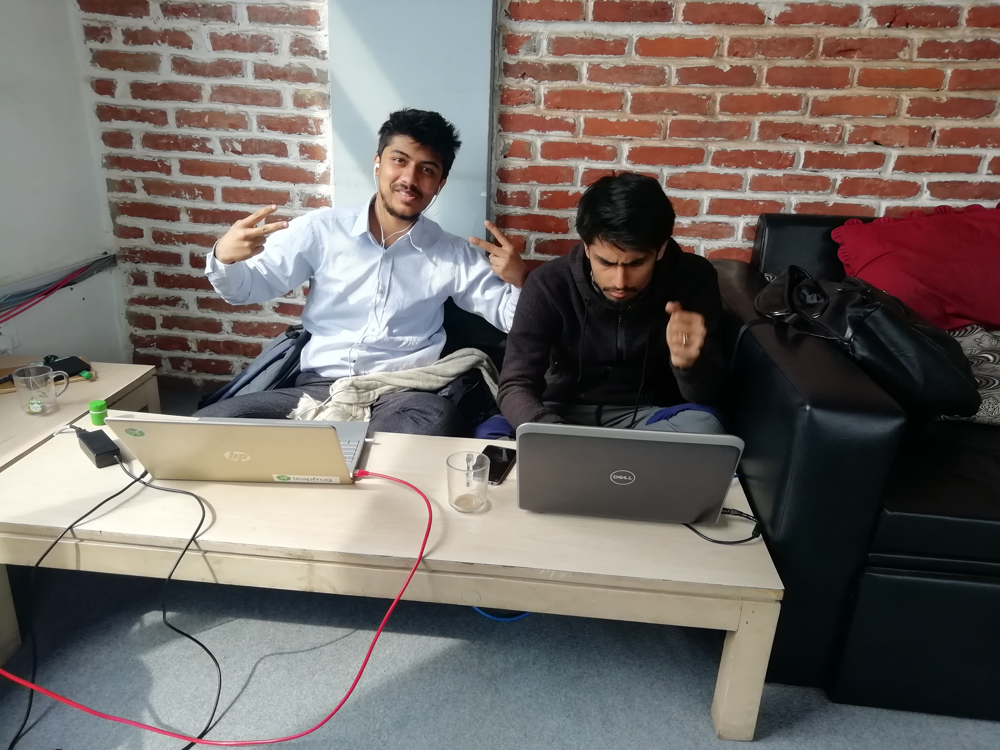

In [84]:
image_file ="bros.jpg"
Image.open(image_file)

In [85]:
print ('Greedy search:', predict_captions_test(image_file))
print ('Beam Search, k=3:', beam_search_predictions_test(image_file, beam_index=3))
print ('Beam Search, k=5:', beam_search_predictions_test(image_file, beam_index=5))
print ('Beam Search, k=7:', beam_search_predictions_test(image_file, beam_index=7))

Greedy search: Two boys are sitting on a raft on a lake .
Beam Search, k=3: Two women are sitting on a raft in a lake .
Beam Search, k=5: Two women are sitting on a raft in a lake .
Beam Search, k=7: Two boys are sitting on a raft on a lake .
